In [1]:
import glob
import ipywidgets as widgets
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import plotly.express as px
from ipywidgets import interact
from natsort import natsorted
from scipy.spatial import distance_matrix

plt.rcParams.update({
"text.usetex": False,
"font.family": ["sans-serif"],
"font.sans-serif": ["Computer Modern Sans Serif"]})


In [2]:
params = pd.read_csv("data/params_file.csv")

def get_loc(i):
    if os.path.isfile(f'../LowSwitch/ID-{i}_time-500_From2ParamSweep_Data.csv'):
        return '../LowSwitch'
    if os.path.isfile(f'../HighSwitch/ID-{i}_time-500_From2ParamSweep_Data.csv'):
        return '../HighSwitch'
    return 'data'

In [3]:
i = 401
ID = f'{get_loc(i)}/ID-{i}_time-*_From2ParamSweep_Data.csv'

In [4]:
MPs = []
vessels = []
tumours = []
stromas = []
necrotics = []

for f in natsorted(glob.glob(ID)):
    df = pd.read_csv(f)
    mp = df[df.celltypes == 'Macrophage'][['points_x', 'points_y', 'phenotypes']].to_numpy()
    vessel = df[df.celltypes == 'Vessel'][['points_x', 'points_y']].to_numpy()
    tumour = df[df.celltypes == 'Tumour'][['points_x', 'points_y']].to_numpy()
    stroma = df[df.celltypes == 'Stroma'][['points_x', 'points_y']].to_numpy()
    necrotic = df[df.celltypes == 'Necrotic'][['points_x', 'points_y']].to_numpy()

    MPs.append(mp)
    tumours.append(tumour)
    vessels.append(vessel)
    stromas.append(stroma)
    necrotics.append(necrotic)

assert len(MPs) > 0

In [5]:
def matching(A, B):
    eyedee = { i:i for i in range(min(len(A), len(B))) }
    return eyedee, eyedee


In [6]:
orbs = [ ]
orbs_prev = {
    i: { 'birth': 0, 'coords': [ MPs[0][i] ] }
    for i in range(len(MPs[0]))
}

for t in range(1, len(MPs)):
    orbs_ = {}
    As = MPs[t-1]
    Bs = MPs[t]
    A2B, B2A = matching(As, Bs)

    for j in range(len(Bs)):
        if j in B2A:
            orbs_[j] = {
                'birth': orbs_prev[B2A[j]]['birth'],
                'coords': orbs_prev[B2A[j]]['coords'] + [ Bs[j] ],
            }
        else:
            orbs_[j] = {
                'birth': t,
                'coords': [ Bs[j] ], 
            }
    orbs_prev = orbs_
    
    for i in range(len(As)):
        if i not in A2B:
            orbs.append( {
                'birth': orbs_prev[i]['birth'],
                'death': t,
                'coords': orbs_prev[i]['coords'],
            } )

for orb in orbs_prev.values():
    orbs.append({
        'birth': orb['birth'],
        'death': len(MPs),
        'coords': orb['coords'],
    })



In [7]:
color = plt.cm.rainbow(np.linspace(0, 1, len(orbs)))

TAIL_LENGTH = 0

def traj(t):
    cnt = 0
    plt.figure(figsize=(3,3), dpi=200)
    plt.scatter(stromas[t][:,0], stromas[t][:,1], c='lavender', s=1.5, label='Stroma')
    plt.scatter(tumours[t][:,0], tumours[t][:,1], c='pink', s=1.5, zorder=10, label='Tumour')
    plt.scatter(necrotics[t][:,0], necrotics[t][:,1], c='gray', s=1.5, label='Necrotic')
    plt.scatter(vessels[t][:,0], vessels[t][:,1], c='magenta', marker='x', linewidth=.5, s=5, zorder=11, label='Vessel')
    # plt.legend()
    plt.xlim(0, 50); plt.ylim(0, 50)
    plt.xticks([]); plt.yticks([])

    for i, orb in enumerate(orbs):
        if orb['birth'] <= t and orb['death'] > t:
            cnt += 1
            t_end = t-orb['birth']
            t_start = max(0, t_end-TAIL_LENGTH)
            orb = np.array(orb['coords'])[t_start:t_end+1]
            plt.plot(
                orb[:, 0], 
                orb[:, 1], 
                '-',
                c=color[i],
            )
            plt.scatter(orb[-1,0], orb[-1,1], c=orb[-1,2], cmap='viridis_r', vmin=0, vmax=1, marker='x', s=3)
    plt.show()
    
    # D = distance_matrix(vessels[t], tumours[t])
    # D[D == 0] = np.inf
    # return sorted(D.min(axis=1))
    return f"Nb of macrophages: {cnt}"
    # mp = MPs[t]
    # return len(mp[mp[:,2] < .5]) / len(mp)

interact(traj, t=(0,50,1));


interactive(children=(IntSlider(value=25, description='t', max=50), Output()), _dom_classes=('widget-interact'…

Text(0, 0.5, 'Macrophage phenotype')

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Computer Modern Sans Serif


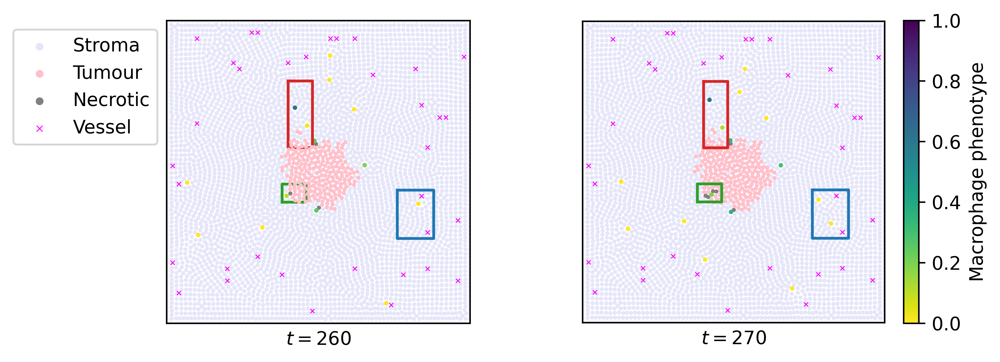

In [8]:
# ID-401, t=26 and t=27
plt.figure(figsize=(8,3), dpi=600)

plt.subplot(1,2,1, aspect='equal')
t=26
plt.xlabel('$t=260$')
# Boxes
plt.plot([20,24,24,20,20], [40,40,29,29,40], c='tab:red', )
plt.plot([19,23,23,19,19], [20,20,23,23,20], c='tab:green', )
plt.plot([38,44,44,38,38], [22,22,14,14,22], c='tab:blue', )
# Cells
plt.scatter(stromas[t][:,0], stromas[t][:,1], c='lavender', s=1.5, label='Stroma')
plt.scatter(tumours[t][:,0], tumours[t][:,1], c='pink', s=1.5, label='Tumour', zorder=10)
plt.scatter(necrotics[t][:,0], necrotics[t][:,1], c='gray', s=1.5, label='Necrotic')
plt.scatter(vessels[t][:,0], vessels[t][:,1], c='magenta', marker='x', linewidth=.5, s=5, label='Vessel', zorder=11)
plt.scatter(MPs[t][:,0], MPs[t][:,1], c=MPs[t][:,2], cmap='viridis_r', vmin=0, vmax=1, s=2)
plt.xticks([]); plt.yticks([])
plt.xlim(0, 50); plt.ylim(0, 50)
# Legend on the left
for handle in plt.legend(bbox_to_anchor=(0, 1)).legendHandles: handle.set_sizes([10.])

plt.subplot(1,2,2, aspect='equal')
t=27
plt.xlabel('$t=270$')
# Boxes
plt.plot([20,24,24,20,20], [40,40,29,29,40], c='tab:red', )
plt.plot([19,23,23,19,19], [20,20,23,23,20], c='tab:green', )
plt.plot([38,44,44,38,38], [22,22,14,14,22], c='tab:blue', )
# Cells
plt.scatter(stromas[t][:,0], stromas[t][:,1], c='lavender', s=1.5, label='Stroma')
plt.scatter(tumours[t][:,0], tumours[t][:,1], c='pink', s=1.5, label='Tumour')
plt.scatter(necrotics[t][:,0], necrotics[t][:,1], c='gray', s=1.5, label='Necrotic')
plt.scatter(vessels[t][:,0], vessels[t][:,1], c='magenta', marker='x', linewidth=.5, s=5, label='Vessel')
plt.scatter(MPs[t][:,0], MPs[t][:,1], c=MPs[t][:,2], cmap='viridis_r', vmin=0, vmax=1, s=2)
plt.xlim(0, 50); plt.ylim(0, 50)
plt.xticks([]); plt.yticks([])
# Colorbar on the right
plt.colorbar().ax.set_ylabel('Macrophage phenotype')


In [9]:
fig, axs = plt.subplots(3, 6, figsize=(20, 10), constrained_layout=True, dpi=600)
IDs = [281, 589, 1189]

for i, i_ in enumerate([183, 755, 1189]):
    ID = f'{get_loc(i_)}/ID-{i_}_time-*_From2ParamSweep_Data.csv'
    param = params[params.simulation_id == f"AWS_ParameterSweep_24072021/{i_}"].iloc[0]
    MPs = []
    vessels = []
    tumours = []
    stromas = []
    necrotics = []
    for f in natsorted(glob.glob(ID)):
        df = pd.read_csv(f)
        mp = df[df.celltypes == 'Macrophage'][['points_x', 'points_y', 'phenotypes']].to_numpy()
        vessel = df[df.celltypes == 'Vessel'][['points_x', 'points_y']].to_numpy()
        tumour = df[df.celltypes == 'Tumour'][['points_x', 'points_y']].to_numpy()
        stroma = df[df.celltypes == 'Stroma'][['points_x', 'points_y']].to_numpy()
        necrotic = df[df.celltypes == 'Necrotic'][['points_x', 'points_y']].to_numpy()
        MPs.append(mp)
        tumours.append(tumour)
        vessels.append(vessel)
        stromas.append(stroma)
        necrotics.append(necrotic)
    print("M2 ratio", len(mp[mp[:,2] >= .5]) / len(mp))
    assert len(MPs) > 0
# 
    for j, t in enumerate(range(25, 51, 5)):
        ax = axs[i][j]
        ax.set_xlabel(f'$t={t*10}$')
        # Cells
        ax.scatter(stromas[t][:,0], stromas[t][:,1], c='lavender', s=1.5, label='Stroma')
        ax.scatter(tumours[t][:,0], tumours[t][:,1], c='pink', s=1.5, label='Tumour', zorder=10)
        ax.scatter(necrotics[t][:,0], necrotics[t][:,1], c='gray', s=1.5, label='Necrotic')
        ax.scatter(vessels[t][:,0], vessels[t][:,1], c='magenta', marker='x', linewidth=.5, s=5, label='Vessel', zorder=11)
        mp = ax.scatter(MPs[t][:,0], MPs[t][:,1], c=MPs[t][:,2], cmap='viridis_r', vmin=0, vmax=1, s=2)
        ax.set_xticks([]); ax.set_yticks([])
        ax.set_xlim(0, 50); ax.set_ylim(0, 50)
        # Legend on the left
        if i == 0 and j == 0:
            for handle in ax.legend(bbox_to_anchor=(-0.1, 1)).legendHandles: handle.set_sizes([10.])
        # Colorbar on the right
        if i == 1 and j == 5:
            ax.figure.colorbar(mp).ax.set_ylabel('Macrophage phenotype')
        # Params
        if j == 0:
            ax.set_ylabel(fr"$c_{{1/2}} = {param.halfMaximalExtravasationCsf1Conc}; \chi_c^m = {param.chi_macrophageToCSF}; g_\mathrm{{crit}} = {param.tgfThresholdForPhenotypeSwitch}$")

    

M2 ratio 0.23114355231143552
M2 ratio 0.1829787234042553


/var/folders/qs/_n_tglmn4rz7tzwynwxk4f7w0000gn/T/ipykernel_76149/2019862554.py:43: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  ax.figure.colorbar(mp).ax.set_ylabel('Macrophage phenotype')


M2 ratio 0.6891891891891891
